# Neural network-based singing voice synthesis demo using kiritan_singing database (Japanese)

This is a demo of a singing voice synthesis system trained on the [kiritan_singing database (*Japanese*)](https://zunko.jp/kiridev/login.php). Given a musicxml file, the system generates waveform.

All the models were trained using https://github.com/r9y9/nnsvs/. Recipes to reproduce experiments are included in the repository: https://github.com/r9y9/nnsvs/tree/master/egs/kiritan_singing.

Estimate time to run: 5 mins.


## Notice

This is an alpha version of demo and singing voice quality is not very high (this is expected). Major updates and improvements are comming soon. More details on this project can be found at https://github.com/r9y9/nnsvs/issues/1.

## Download music xml files

## Install requirements

At the moment, nnsvs depends on sinsy (C++ library) for the muxicxml to context feature conversion. Installing binary dependencies is a bit complicated, but here goes the complete setup.

In [1]:
# ! git clone -q https://github.com/r9y9/kiritan_singing

In [2]:
# ! pip install -q -U numpy cython
# ! rm -rf hts_engine_API sinsy pysinsy nnmnkwii nnsvs

In [3]:
# Binary dependencies
# ! git clone -q https://github.com/r9y9/hts_engine_API
# ! cd hts_engine_API/src && ./waf configure --prefix=/usr/ && sudo ./waf build > /dev/null 2>&1 && ./waf install
# ! git clone -q https://github.com/r9y9/sinsy
# ! cd sinsy/src/ && mkdir -p build && cd build && cmake -DCMAKE_BUILD_TYPE=Release -DBUILD_SHARED_LIBS=ON -DCMAKE_INSTALL_PREFIX=/usr/ .. && make -j > /dev/null 2>&1 && sudo make install


In [4]:
# Python dependencies
# ! git clone -q https://github.com/r9y9/pysinsy
# ! cd pysinsy && export SINSY_INSTALL_PREFIX=/usr/ && pip install -q .
# ! git clone -q https://github.com/r9y9/nnmnkwii
# ! cd nnmnkwii && pip install -q .
# ! git clone -q https://github.com/r9y9/nnsvs 
# ! cd nnsvs && pip install -q .

In [5]:
# !pip install matplotlib
# !pip install pysptk
# !sudo apt-get install python3-numpy python3-scipy
# !sudo pip install bandmat
# !pip install git+https://github.com/r9y9/pysptk

## Python imports

In [6]:
%pylab inline
rcParams["figure.figsize"] = (16,5)

Populating the interactive namespace from numpy and matplotlib


In [61]:
import hydra
from omegaconf import DictConfig, OmegaConf
import numpy as np
import joblib
import torch
from os.path import join, basename, exists
import os
import pysptk
import pyworld
import librosa
import librosa.display
import IPython
from IPython.display import Audio
from nnmnkwii.io import hts
from nnmnkwii import paramgen
from nnmnkwii.preprocessing.f0 import interp1d
from nnmnkwii.frontend import merlin as fe

from nnsvs.multistream import multi_stream_mlpg, split_streams
from nnsvs.gen import (
    predict_timelag, predict_duration, predict_acoustic, postprocess_duration,
    gen_waveform, get_windows, get_static_stream_sizes)
from nnsvs.frontend.ja import xml2lab, _lazy_init
from nnsvs.gen import _midi_to_hz

_lazy_init(dic_dir="/usr/lib/sinsy/dic")

In [8]:
sample_rate = 48000
frame_period = 5
fftlen = pyworld.get_cheaptrick_fft_size(sample_rate)
alpha = pysptk.util.mcepalpha(sample_rate)
hop_length = int(0.001 * frame_period * sample_rate)

## Setup models

In [9]:
# ! curl -q -LO https://www.dropbox.com/s/pctlausq00eecqp/20200502_kiritan_singing-00-svs-world.zip
# ! unzip -qq -o 20200502_kiritan_singing-00-svs-world.zip

model_dir = "./20200502_kiritan_singing-00-svs-world"

In [10]:
use_cuda = True
if use_cuda and torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

### Time-lag model

In [11]:
timelag_config = OmegaConf.load(join(model_dir, "timelag", "model.yaml"))
timelag_model = hydra.utils.instantiate(timelag_config.netG).to(device)
checkpoint = torch.load(join(model_dir, "timelag", "latest.pth"), map_location=lambda storage, loc: storage)
timelag_model.load_state_dict(checkpoint["state_dict"])
timelag_in_scaler = joblib.load(join(model_dir, "in_timelag_scaler.joblib"))
timelag_out_scaler = joblib.load(join(model_dir, "out_timelag_scaler.joblib"))
timelag_model.eval();

/home/arthur/venv/py37/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator MinMaxScaler from version 0.22.2.post1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/home/arthur/venv/py37/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator StandardScaler from version 0.22.2.post1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


### Duration model

In [12]:
duration_config = OmegaConf.load(join(model_dir, "duration", "model.yaml"))
duration_model = hydra.utils.instantiate(duration_config.netG).to(device)
checkpoint = torch.load(join(model_dir, "duration", "latest.pth"), map_location=lambda storage, loc: storage)
duration_model.load_state_dict(checkpoint["state_dict"])
duration_in_scaler = joblib.load(join(model_dir, "in_duration_scaler.joblib"))
duration_out_scaler = joblib.load(join(model_dir, "out_duration_scaler.joblib"))
duration_model.eval();

### Acoustic model

In [46]:
acoustic_config = OmegaConf.load(join(model_dir, "acoustic", "model.yaml"))
acoustic_model = hydra.utils.instantiate(acoustic_config.netG).to(device)
checkpoint = torch.load(join(model_dir, "acoustic", "latest.pth"), map_location=lambda storage, loc: storage)
acoustic_model.load_state_dict(checkpoint["state_dict"])
acoustic_in_scaler = joblib.load(join(model_dir, "in_acoustic_scaler.joblib"))
acoustic_out_scaler = joblib.load(join(model_dir, "out_acoustic_scaler.joblib"))
acoustic_model.eval();

/home/arthur/venv/py37/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator MinMaxScaler from version 0.22.2.post1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/home/arthur/venv/py37/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator StandardScaler from version 0.22.2.post1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


## Synthesis

### Choose your favorite musicxml file here!

In [36]:
# NOTE: 01.xml and 02.xml were not included in the training data
# 03.xml - 37.xml were used for training.
labels = xml2lab("/home/arthur/data/kiritan_singing/musicxml/01.xml").round_()

In [38]:
question_path = join(model_dir, "jp_qst001_nnsvs.hed")
binary_dict, continuous_dict = hts.load_question_set(question_path, append_hat_for_LL=False)

In [39]:
# pitch indices in the input features
pitch_idx = len(binary_dict) + 1
pitch_indices = np.arange(len(binary_dict), len(binary_dict)+3)
log_f0_conditioning = True

### Predict time-lag

In [40]:
lag = predict_timelag(device, labels, timelag_model, timelag_config, timelag_in_scaler,
    timelag_out_scaler, binary_dict, continuous_dict, pitch_indices,
    log_f0_conditioning)
lag.shape

(241, 1)

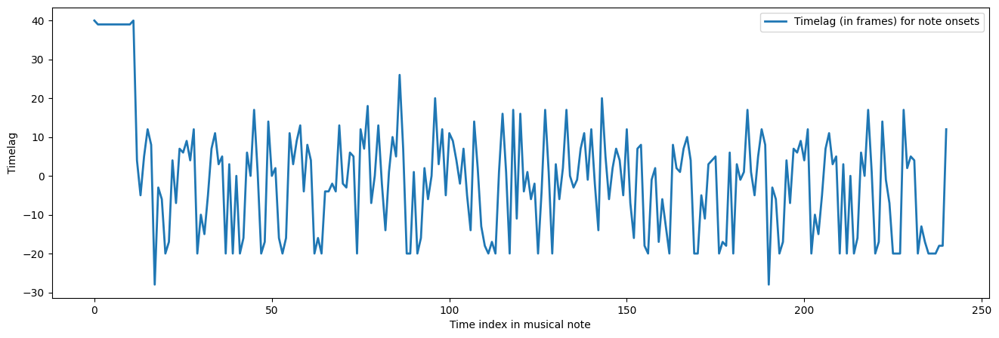

In [41]:
plot(lag / 50000, label="Timelag (in frames) for note onsets", linewidth=2)
xlabel("Time index in musical note")
ylabel("Timelag")
legend();

### Predict phoneme durations

In [42]:
durations = predict_duration(device, labels, duration_model, duration_config,
    duration_in_scaler, duration_out_scaler, lag, binary_dict, continuous_dict,
    pitch_indices, log_f0_conditioning)
durations.shape

(449, 1)

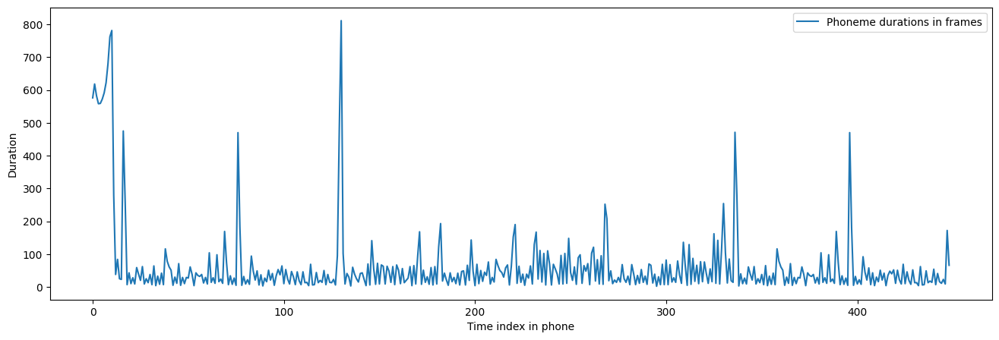

In [43]:
plot(durations, label="Phoneme durations in frames")
xlabel("Time index in phone")
ylabel("Duration")
legend();

In [44]:
# Normalize phoneme durations to satisfy constraints by the musical score
duration_modified_labels = postprocess_duration(labels, durations, lag)

### Predict acoustic features

In [47]:
acoustic_features = predict_acoustic(device, duration_modified_labels, acoustic_model, acoustic_config,
    acoustic_in_scaler, acoustic_out_scaler, binary_dict, continuous_dict,
    "coarse_coding", pitch_indices, log_f0_conditioning)
acoustic_features.shape

(24592, 67)

### Visualize acoustic features

Before generating a wavefrom, let's visualize acoustic features to understand how the acoustic model works. Since acoustic features contain multiple differnt features (*multi-stream*, e.g., mgc, lf0, vuv and bap), let us first split acoustic features.

In [26]:
stream_sizes = acoustic_config.stream_sizes
has_dynamic_features = acoustic_config.has_dynamic_features
# (mgc, lf0, vuv, bap) with delta and delta-delta except for vuv
stream_sizes, has_dynamic_features

([180, 3, 1, 15], [True, True, False, True])

In [63]:
static_stream_sizes = get_static_stream_sizes(stream_sizes, has_dynamic_features, 3)
mgc, diff_lf0, vuv, bap = split_streams(acoustic_features, static_stream_sizes)

#### Visualize F0

In [66]:
# relative f0 -> absolute f0
# need to extract pitch sequence from the musical score
linguistic_features = fe.linguistic_features(duration_modified_labels,
                                            binary_dict, continuous_dict,
                                            add_frame_features=True,
                                            subphone_features="coarse_coding")
f0_score = _midi_to_hz(linguistic_features, pitch_idx, False)[:, None]
lf0_score = f0_score.copy()
nonzero_indices = np.nonzero(lf0_score)
lf0_score[nonzero_indices] = np.log(f0_score[nonzero_indices])
lf0_score = interp1d(lf0_score, kind="slinear")

f0 = diff_lf0 + lf0_score
f0[vuv < 0.5] = 0
f0[np.nonzero(f0)] = np.exp(f0[np.nonzero(f0)])

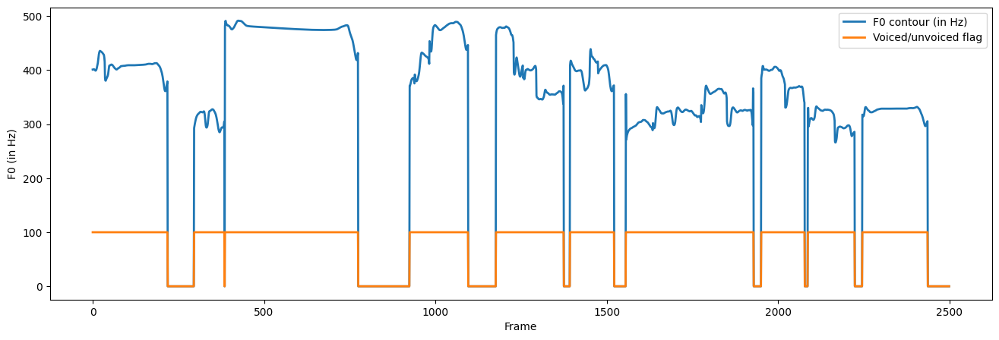

In [67]:
plot(f0[-2500:, :], linewidth=2, label="F0 contour (in Hz)")
plot((vuv[-2500:, :] > 0.5)*100, linewidth=2, label="Voiced/unvoiced flag")
legend()
xlabel("Frame")
ylabel("F0 (in Hz)");

#### Visualize spectrogram

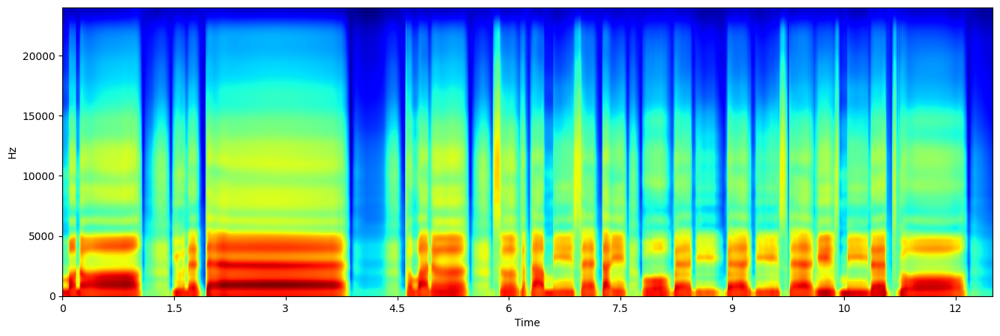

In [69]:
# Trim and visualize (to save memory and time)
logsp = np.log(pysptk.mc2sp(mgc[-2500:, :], alpha=alpha, fftlen=fftlen))
librosa.display.specshow(logsp.T, sr=sample_rate, hop_length=hop_length, x_axis="time", y_axis="linear", cmap="jet");

#### Visualize aperiodicity

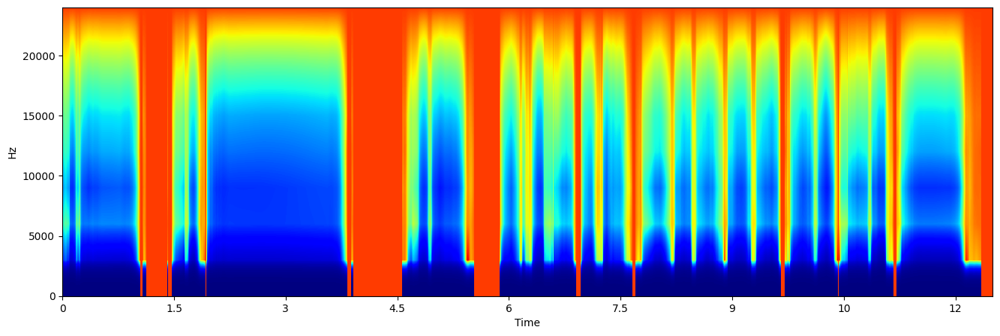

In [70]:
aperiodicity = pyworld.decode_aperiodicity(bap[-2500:, :].astype(np.float64), sample_rate, fftlen)
librosa.display.specshow(aperiodicity.T, sr=sample_rate, hop_length=hop_length, x_axis="time", y_axis="linear", cmap="jet");

### Generate waveform

Finally, let's generate waveform and listen to the sample.

In [33]:
generated_waveform = gen_waveform(
    duration_modified_labels, acoustic_features, 
    binary_dict, continuous_dict, acoustic_config.stream_sizes,
    acoustic_config.has_dynamic_features,
    "coarse_coding", log_f0_conditioning,
    pitch_idx, num_windows=3,
    post_filter=True, sample_rate=sample_rate, frame_period=frame_period,
    relative_f0=True)

# trim trailing/leading silences for covenience
generated_waveform = librosa.effects.trim(generated_waveform)[0]

## Listen to the generated sample

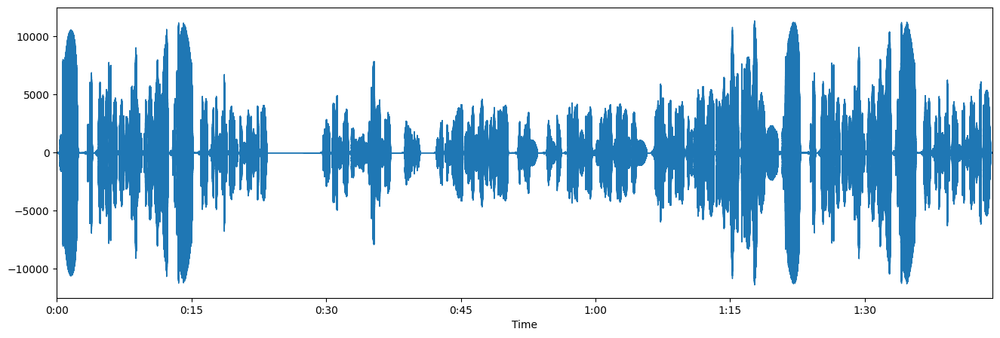

In [34]:
librosa.display.waveplot(generated_waveform, sample_rate, x_axis="time")
IPython.display.display(Audio(generated_waveform, rate=sample_rate))

## Summary

A demo of a singing voice synthesis system based on neural networks. Full code is available https://github.com/r9y9/nnsvs.


## References

- Kiritan database: https://zunko.jp/kiridev/login.php
- Code to reproduce: https://github.com/r9y9/nnsvs